In [68]:
import numpy as np                               # 向量和矩阵运算
import pandas as pd                              # 表格与数据处理
import matplotlib.pyplot as plt                  # 绘图
import matplotlib as mpl
import seaborn as sns                            # 更多绘图功能
sns.set()
mpl.rcParams['figure.dpi'] = 200

from dateutil.relativedelta import relativedelta # 日期数据处理
from scipy.optimize import minimize              # 优化函数

import statsmodels.formula.api as smf            # 数理统计
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs

from itertools import product                    # 一些有用的函数
from tqdm import tqdm_notebook

import warnings                                  # 勿扰模式
warnings.filterwarnings('ignore')

from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error #eva
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error
from sklearn.model_selection import TimeSeriesSplit # you have everything done for you

# 时间序列学期报告
## 应用统计硕士 2020270026 王姿文

这篇使用的数据来自于Kaggle，为真实游戏数据，此份报告使用jupyter完成，为了报告内容清晰故不涵盖coding，coding附于project.py内。   
   
     
     
以下为本篇报告的大纲：
1. 数据介绍
2. 移动&平滑   
    2.1 Moving Average Method   
    2.2 Smoothing Method   
        2.2.1 Exponential Smoothing   
        2.2.2 Double Exponential Smoothing     
        2.2.3 Triple Exponential Smoothing(Holt-Winters Model)   
3. ARIMA   
    3.1 平稳性检验   
    3.2 Seasonal Autoregression Moving Average model   

-------
## 1. 数据介绍

- 数据来源：Kaggle
- 数据内容：手游玩家每小时观看的广告量以及手游玩家每天的游戏币消费情况，为两个数据的结合
- 选择原因：两个数据分别为短期时间序列数据和中长期时间序列数据，因此可以同时分析两种类型的数据

In [100]:
ads = pd.read_csv('/Users/wangziwen/Documents/Graduation/1st/Time Series Analysis/data/ads.csv', index_col=['Time'], parse_dates=['Time'])
currency = pd.read_csv('/Users/wangziwen/Documents/Graduation/1st/Time Series Analysis/data/currency.csv', index_col=['Time'], parse_dates=['Time'])

### 1.1 手游玩家每小时观看的广告量
- 时间范围：2017-09-13 00:00:00 ~ 2017-09-21 23:00:00
- 前十笔数据：

In [5]:
display(ads[:10])

,Ads
Time,
2017-09-13 00:00:00,80115
2017-09-13 01:00:00,79885
2017-09-13 02:00:00,89325
2017-09-13 03:00:00,101930
2017-09-13 04:00:00,121630
2017-09-13 05:00:00,116475
2017-09-13 06:00:00,106495
2017-09-13 07:00:00,102795
2017-09-13 08:00:00,108055


- 这九天内手游玩家每小时观看的广告量趋势图：

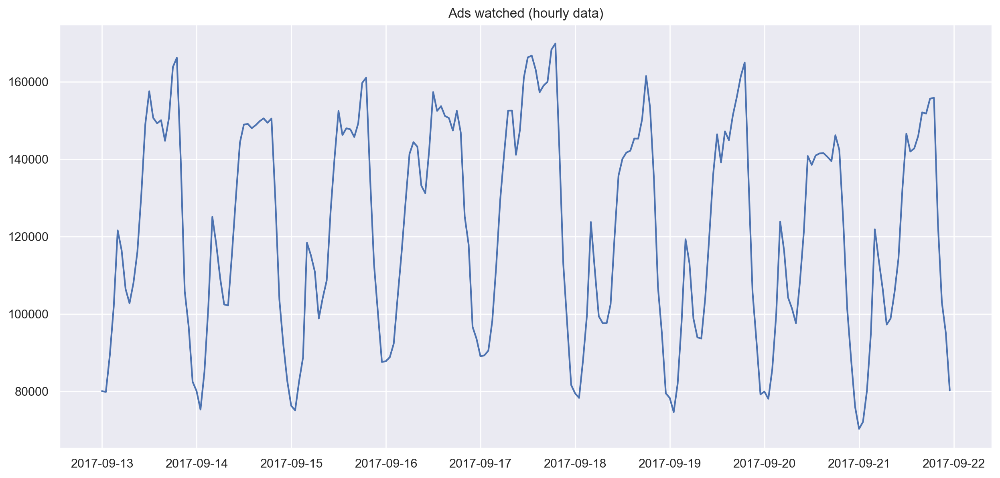

In [10]:
plt.figure(figsize=(15, 7))
plt.plot(ads.Ads)
plt.title('Ads watched (hourly data)')
plt.grid(True)
plt.show()

### 1.2 手游玩家每天的游戏币消费
- 时间范围：2017-05-01 ~ 2018-02-24
- 前十笔数据：

In [6]:
display(currency[:10])

,GEMS_GEMS_SPENT
Time,
2017-05-01,1199436
2017-05-02,1045515
2017-05-03,586111
2017-05-04,856601
2017-05-05,793775
2017-05-06,606535
2017-05-07,1112763
2017-05-08,1121218
2017-05-09,813844


- 这九个月内手游玩家每天的游戏币消费趋势图：

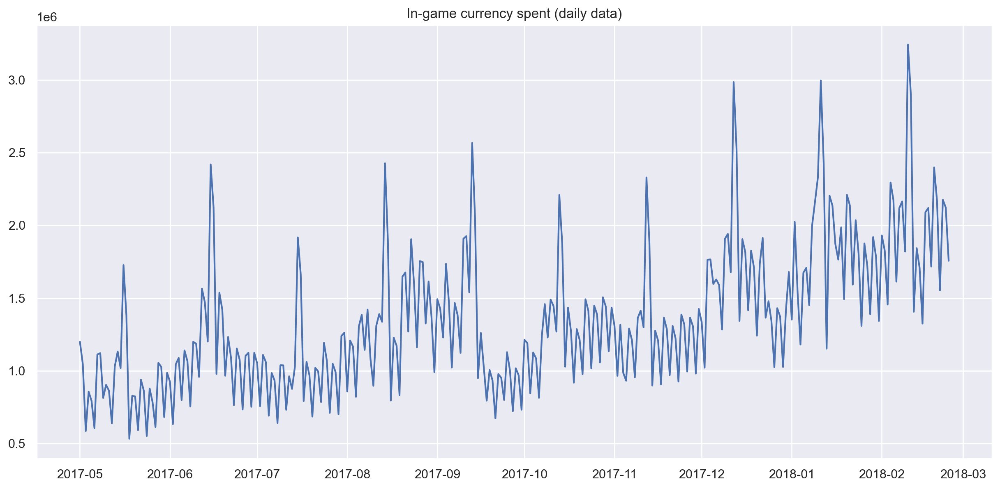

In [17]:
plt.figure(figsize=(15, 7))
plt.plot(currency.GEMS_GEMS_SPENT)
plt.title('In-game currency spent (daily data)')
plt.grid(True)
plt.show()

-------
## 2. Moving Average Method & Smoothing Method
### 2.1 Moving Average Method    
假设未来某个值的预测，取决于它前面的$n$个数的平均值 $\Rightarrow$ 以$moving \ average (移动平均数)$作为预测值：$$\hat{y_t}=\frac{1}{k}\sum_{n=0}^{k-1}y_{t-n}$$   
1. $moving \ average (移动平均数)$比较适合短期预测   
2. $moving \ average (移动平均数)$可对原始的时间序列数据进行平滑处理，以找到数据的变化趋势

### 2.1.1 手游玩家每小时观看的广告量
由下图可看见，n越大则数据预测趋势线越平滑，且n越小越接近原始数据趋势

In [19]:
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [40]:
def plotMovingAverage(series, window, plot_intervals=False, scale=1.96, plot_anomalies=False):

    """
        series - dataframe with timeseries
        window - rolling window size 
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies 
    """
    rolling_mean = series.rolling(window=window).mean()
    fig, ax = plt.subplots(figsize=(15,5))
    ax.ticklabel_format(useOffset=False, style='plain')
    #plt.figure(figsize=(15,5))
    plt.title("Moving average\n n = {}".format(window))
    plt.plot(rolling_mean, "g", label="Rolling mean trend")

    # Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bond = rolling_mean - (mae + scale * deviation)
        upper_bond = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bond, "r--", label="Upper Bond / Lower Bond")
        plt.plot(lower_bond, "r--")
        
        # Having the intervals, find abnormal values
        if plot_anomalies:
            anomalies = pd.DataFrame(index=series.index, columns=series.columns)
            anomalies[series<lower_bond] = series[series<lower_bond]
            anomalies[series>upper_bond] = series[series>upper_bond]
            plt.plot(anomalies, "ro", markersize=10)
        
    plt.plot(series[window:], label="Actual values")
    plt.legend(loc="upper left")
    plt.grid(True)

In [29]:
def moving_average(series, n):
    """
        Calculate average of last n observations
    """
    return np.average(series[-n:])
print('对过去4小时的广告浏览量的预测：',moving_average(ads, 4))

对过去4小时的广告浏览量的预测： 100478.75


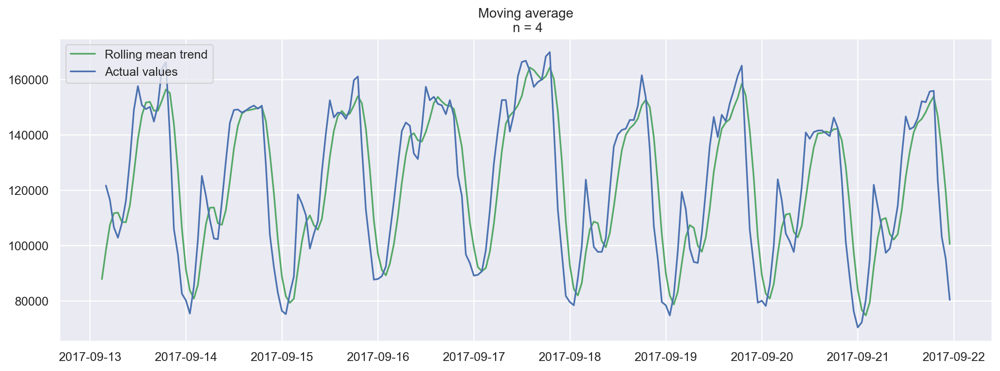

In [26]:
plotMovingAverage(ads, 4)

In [30]:
print('对过去12小时的广告浏览量的预测：',moving_average(ads, 12))

对过去12小时的广告浏览量的预测： 132903.33333333334


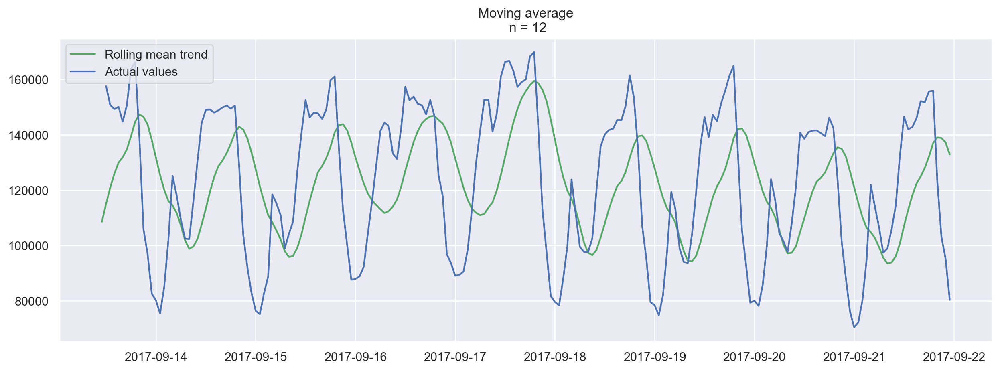

In [27]:
plotMovingAverage(ads, 12)

In [22]:
print('对过去24小时的广告浏览量的预测：',moving_average(ads, 24))

对过去24小时的广告浏览量的预测： 116805.0


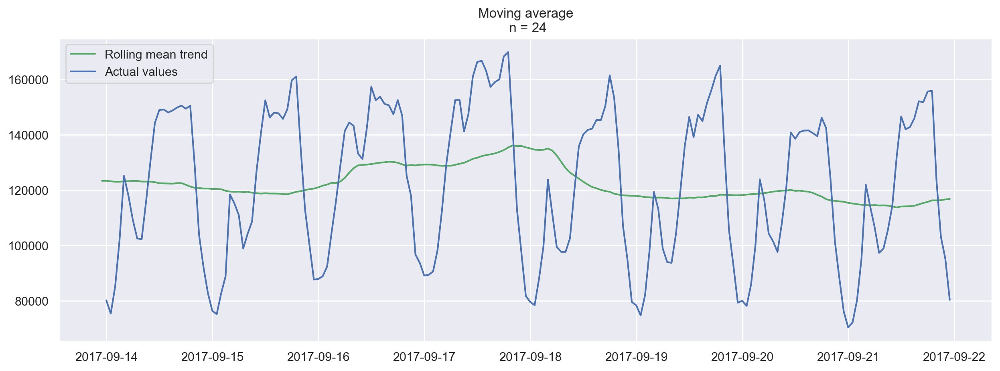

In [28]:
plotMovingAverage(ads, 24)

此外还能以信赖区间来检验异常值，可见均无异常值

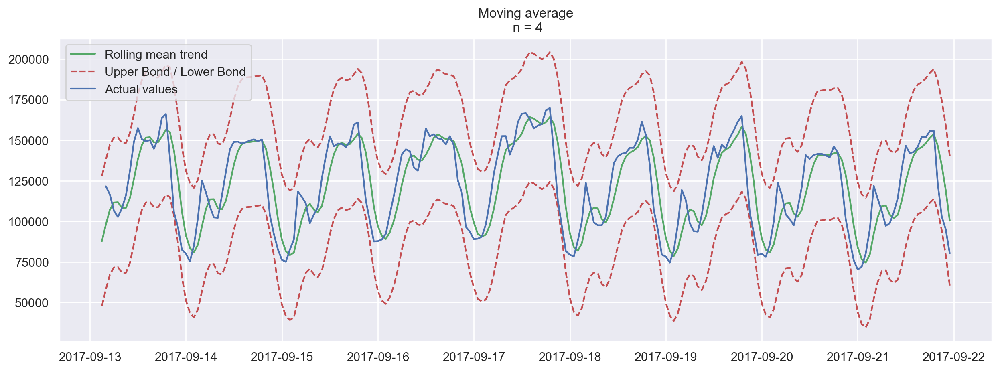

In [31]:
plotMovingAverage(ads, 4, plot_intervals=True, plot_anomalies=True)

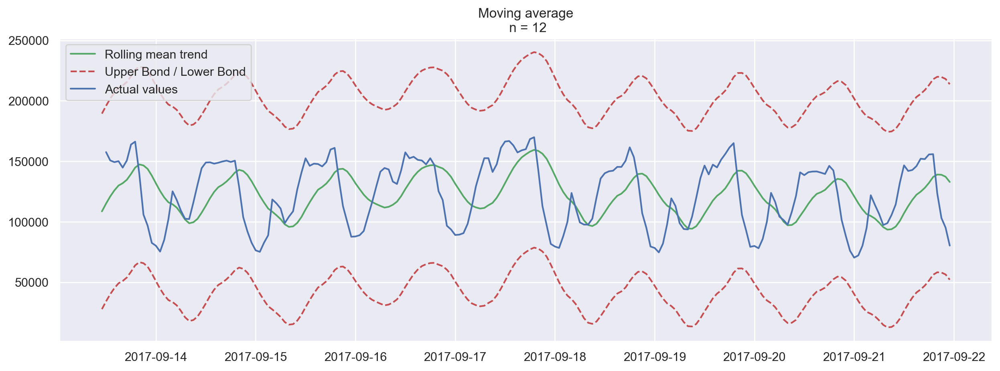

In [32]:
plotMovingAverage(ads, 12, plot_intervals=True, plot_anomalies=True)

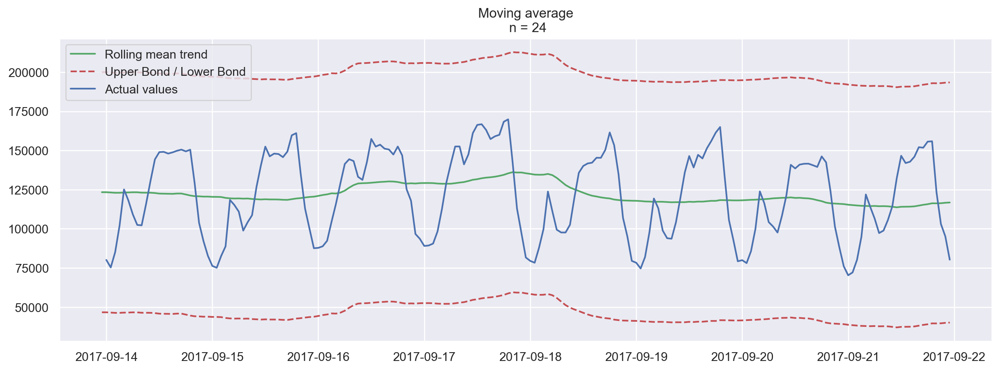

In [33]:
plotMovingAverage(ads, 24, plot_intervals=True, plot_anomalies=True)

### 2.1.2 手游玩家每天的游戏币消费
一样由下图可看见，n越大则数据预测趋势线越平滑，且n越小越接近原始数据趋势   

In [50]:
print('对过去7天游戏币消费的预测：',moving_average(currency, 7))

对过去7天游戏币消费的预测： 1983998.2857142857


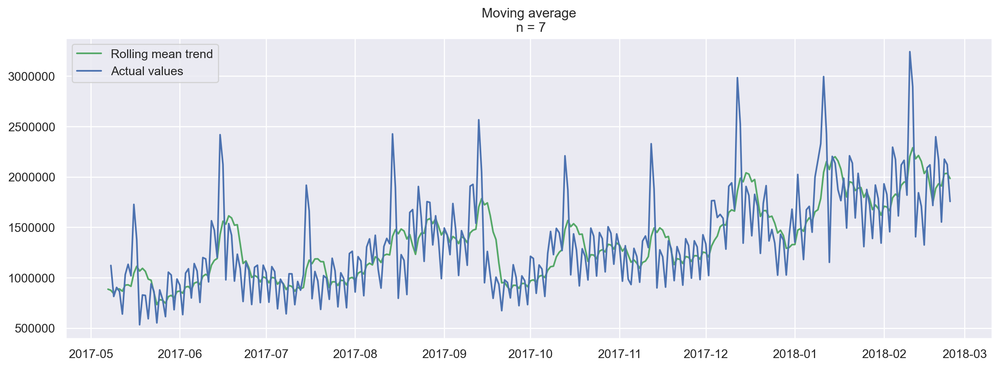

In [51]:
plotMovingAverage(currency, 7)

In [52]:
print('对过去14天游戏币消费的预测：',moving_average(currency, 14))

对过去14天游戏币消费的预测： 1948071.5714285714


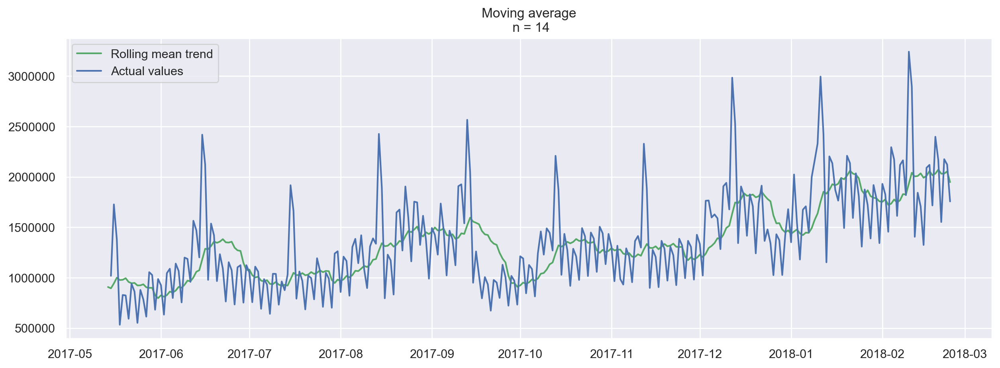

In [53]:
plotMovingAverage(currency, 14)

In [54]:
print('对过去30天游戏币消费的预测：',moving_average(currency, 30))

对过去30天游戏币消费的预测： 1931348.8


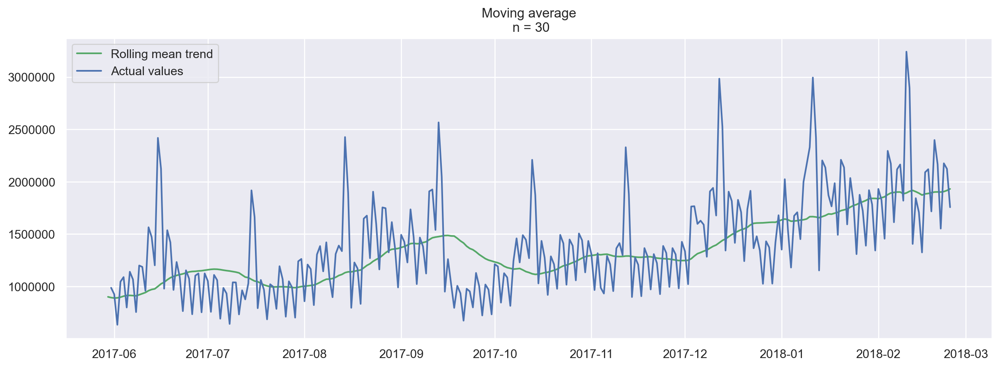

In [55]:
plotMovingAverage(currency, 30)

再來以信赖区间来检验异常值，均見到异常值，它没有在数据中捕捉到每个月中出现的季节性变化，反倒几乎把所有每隔7/14/30天出现的峰值标记为异常

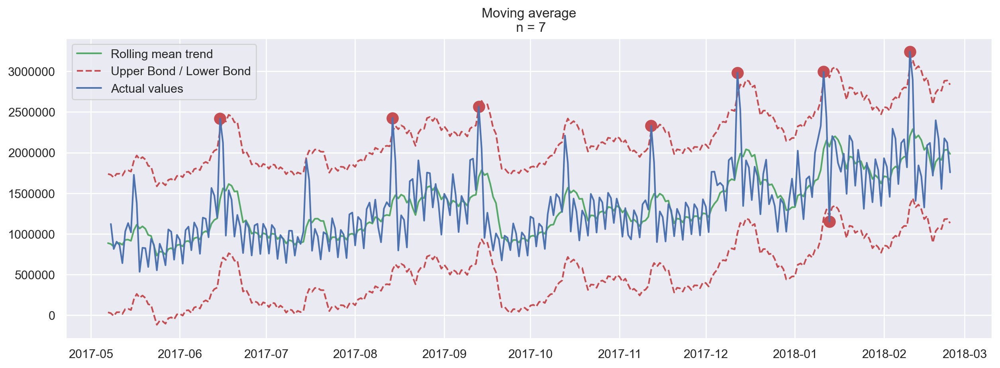

In [56]:
plotMovingAverage(currency, 7, plot_intervals=True, plot_anomalies=True)

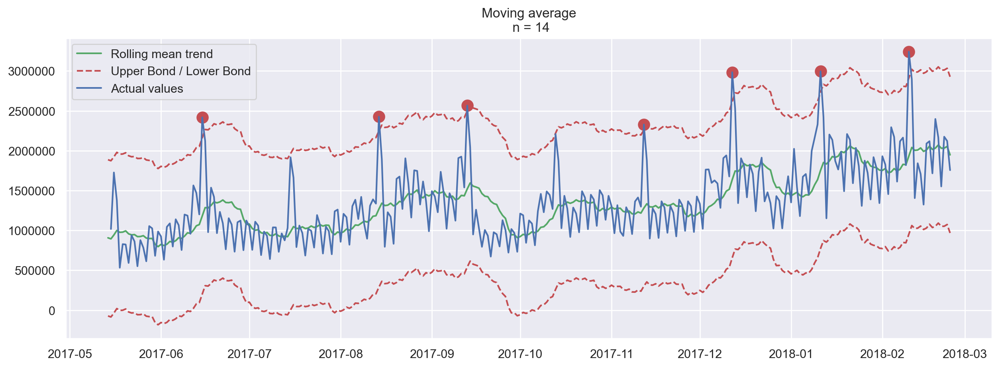

In [57]:
plotMovingAverage(currency, 14, plot_intervals=True, plot_anomalies=True)

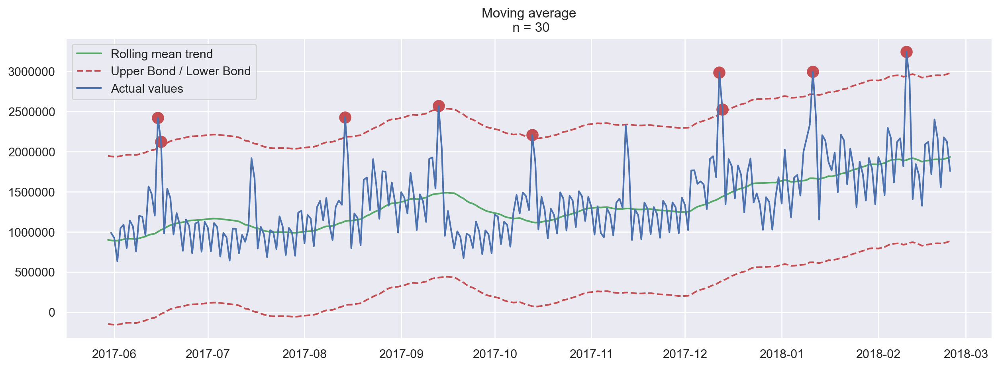

In [58]:
plotMovingAverage(currency, 30, plot_intervals=True, plot_anomalies=True)

### 2.1.3 小结
由上述两个数据能看出方法的合适与否与数据特性高度相关，$moving \ average$的合适度为手游玩家每小时观看的广告量>手游玩家每天的游戏币消费情况

-------
### 2.2 Smoothing Method   
对目前所有的已观测数据进行加权处理，并且每一个数据点的权重，呈指数形式递减   
a. Exponential Smoothing   
$\alpha$表示平滑因子，它定义我们“遗忘”当前真实观测值的速度有多快，$\alpha$越小，表示当前真实观测值的影响力越小，而前一个模型预测值的影响力越大，最终得到的时间序列将会越平滑
$$\hat{y_t}=\alpha y_t+(1-\alpha)\hat{y_{t-1}}$$   
    - 单指数平滑的特点： 能够追踪数据变化。预测过程中，添加了最新的样本数据之后，新数据逐渐取代老数据的地位，最终老数据被淘汰
    - 单指数平滑的局限性： 第一，预测值不能反映趋势变动、季节波动等有规律的变动；第二，这个方法多适用于短期预测，而不适合中长期的预测；第三，由于预测值是历史数据的均值，因此与实际序列相比，有滞后的现象
    - 单指数平滑的系数： EViews提供两种确定指数平滑系数的方法：自动给定和人工确定。一般来说，如果序列变化比较平缓，平滑系数值应该比较小，比如小于0.1；如果序列变化比较剧烈，平滑系数值可以取得大一些，如0.3～0.5。若平滑系数值大于0.5才能跟上序列的变化，表明序列有很强的趋势，不能采用一次指数平滑进行预测
    
    
b. Double Exponential Smoothing  
由于单指数平滑在产生新的序列的时候，考虑了前面的 K 条历史数据，但是仅仅考虑其静态值，即没有考虑时间序列当前的变化趋势 $\Rightarrow$ 如果当前的时间序列数据处于上升趋势，那么当我们对明天的数据进行预测的时候，就不应该仅仅是对历史数据进行”平均“，还应考虑到当前数据变化的上升趋势。同时考虑历史平均和变化趋势，这个就是双指数平滑法   
通过序列分解法 (series decomposition)，可以得到两个分量，$l = intercept (also, level)$，$b = trend (also, slope)$，根据前面学习的方法，知道了如何预测$l$，可以将同样的指数平滑法应用到$b$上
$$l_t=\alpha y_t+(1-\alpha)(l_{t-1}-b_{t-1})$$
$$b_t=\beta (l_{t-1}-b_{t-1})+(1-\beta)b_{t-1}$$
$$\hat{y_{t+1}}=l_t+b_t$$   
    - $\alpha$决定时间序列数据自身变化趋势的平滑程度，$\beta$决定趋势的平滑程度
    
    
c. Triple Exponential Smoothing(Holt-Winters Model)   
与前两种平滑方法相比，这次多考虑了一个因素seasonality(季节性)，故如果时间序列数据不存在季节性变化，就不适合用三指数平滑 $\Rightarrow$ 模型中的季节性分量($=s_t$)，用来解释截距和趋势的重复变化，并且由季节长度来描述，也就是变化重复的周期来描述，其中$\gamma = $指数平滑的权重，$\hat{y_{t+m}}=$未来 m 步之后的预测值
$$l_t=\alpha (y_t-s_{t-L})+(1-\alpha)(l_{t-1}-b_{t-1})$$
$$b_t=\beta (l_{t-1}-b_{t-1})+(1-\beta)b_{t-1}$$
$$s_t = \gamma(y_t-l_t)+(1-\gamma)s_{t-L}$$
$$\hat{y_{t+m}}=l_t+mb_t+s_{t-L+1}+(m-1)modL$$ 

### 2.2.1 Exponential Smoothing
由下图可看见，$\alpha$越大，表示当前真实观测值的影响力越大，而前一个模型预测值的影响力越大，最终得到的时间序列将会越平滑（类似于$moving \ average$内的n越大则趋势图越平滑），由$alpha$的数值以及趋势图来看，两个数据的时序变化确实较为激烈   
其中手游玩家每小时观看的广告量有上升趋势，因此可以考虑Double Exponential Smoothing或riple Exponential Smoothing(Holt-Winters Model)
### 2.2.1.1 手游玩家每小时观看的广告量

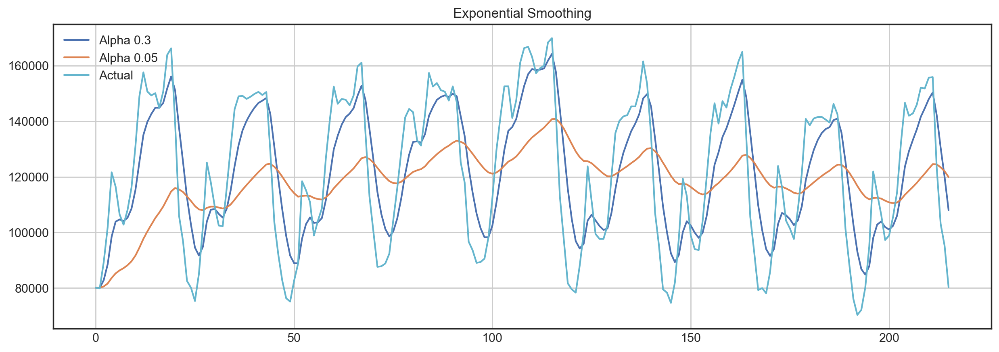

In [62]:
def exponential_smoothing(series, alpha):
    """
        series - dataset with timestamps
        alpha - float [0.0, 1.0], smoothing parameter
    """
    result = [series[0]] # first value is same as series
    for n in range(1, len(series)):
        result.append(alpha * series[n] + (1 - alpha) * result[n-1])
    return result
    
def plotExponentialSmoothing(series, alphas):
    """
        Plots exponential smoothing with different alphas
        
        series - dataset with timestamps
        alphas - list of floats, smoothing parameters
        
    """
    with plt.style.context('seaborn-white'):    
        fig, ax = plt.subplots(figsize=(15,5))
        ax.ticklabel_format(useOffset=False, style='plain')
        for alpha in alphas:
            plt.plot(exponential_smoothing(series, alpha), label="Alpha {}".format(alpha))
        plt.plot(series.values, "c", label = "Actual")
        plt.legend(loc="best")
        plt.axis('tight')
        plt.title("Exponential Smoothing")
        plt.grid(True);
        
plotExponentialSmoothing(ads.Ads, [0.3, 0.05])

### 2.2.1.2 手游玩家每天的游戏币消费

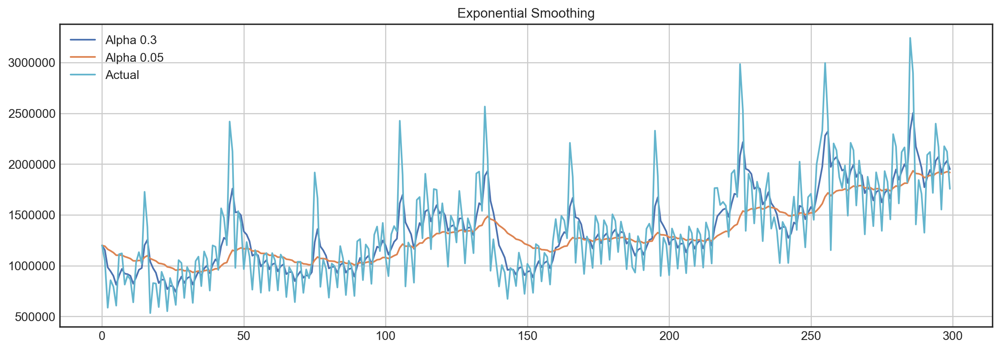

In [63]:
plotExponentialSmoothing(currency.GEMS_GEMS_SPENT, [0.3, 0.05])

### 2.2.2 Double Exponential Smoothing
$\alpha$决定时间序列数据自身变化趋势的平滑程度，$\beta$决定趋势的平滑程度，下图为不同$\alpha \& \beta$的组合，与Exponential Smoothing最明显不同之处在于手游玩家每小时观看的广告量的上升趋势被预测地明显许多
### 2.2.2.1 手游玩家每小时观看的广告量

In [64]:
def double_exponential_smoothing(series, alpha, beta):
    """
        series - dataset with timeseries
        alpha - float [0.0, 1.0], smoothing parameter for level
        beta - float [0.0, 1.0], smoothing parameter for trend
    """
    # first value is same as series
    result = [series[0]]
    for n in range(1, len(series)+1):
        if n == 1:
            level, trend = series[0], series[1] - series[0]
        if n >= len(series): # forecasting
            value = result[-1]
        else:
            value = series[n]
        last_level, level = level, alpha*value + (1-alpha)*(level+trend)
        trend = beta*(level-last_level) + (1-beta)*trend
        result.append(level+trend)
    return result

def plotDoubleExponentialSmoothing(series, alphas, betas):
    """
        Plots double exponential smoothing with different alphas and betas
        
        series - dataset with timestamps
        alphas - list of floats, smoothing parameters for level
        betas - list of floats, smoothing parameters for trend
    """
    
    with plt.style.context('seaborn-white'):  
        fig, ax = plt.subplots(figsize=(20,8))
        ax.ticklabel_format(useOffset=False, style='plain')
        for alpha in alphas:
            for beta in betas:
                plt.plot(double_exponential_smoothing(series, alpha, beta), label="Alpha {}, beta {}".format(alpha, beta))
        plt.plot(series.values, label = "Actual")
        plt.legend(loc="best")
        plt.axis('tight')
        plt.title("Double Exponential Smoothing")
        plt.grid(True)
        

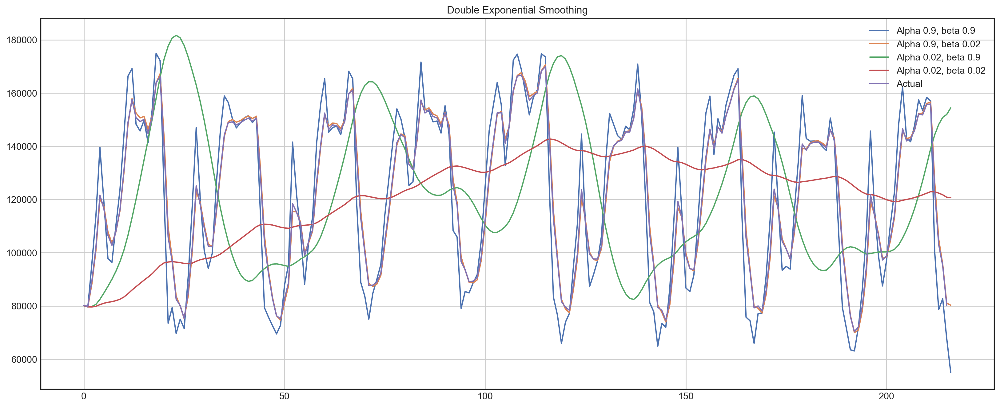

In [65]:
plotDoubleExponentialSmoothing(ads.Ads, alphas=[0.9, 0.02], betas=[0.9, 0.02])

### 2.2.2.2 手游玩家每天的游戏币消费

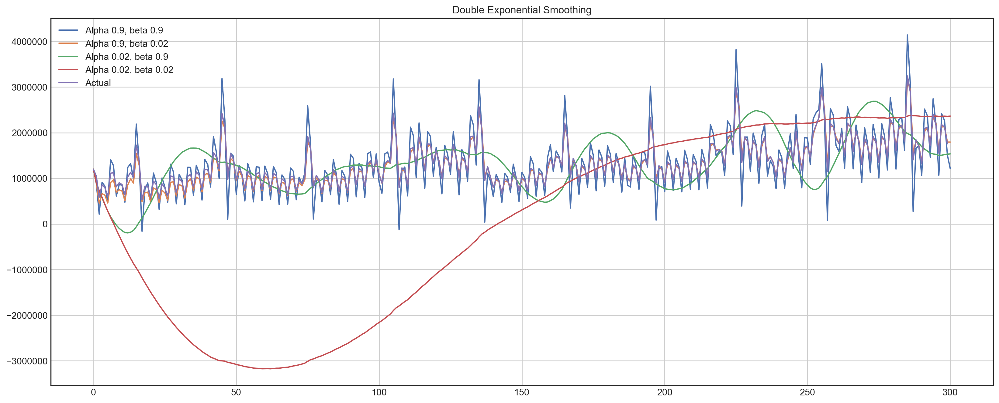

In [66]:
plotDoubleExponentialSmoothing(currency.GEMS_GEMS_SPENT, alphas=[0.9, 0.02], betas=[0.9, 0.02])

### 2.2.3 Triple Exponential Smoothing(Holt-Winters Model)
相较上述两个方式，此方法考量季节性变量   
下面将应用Holt-Winters Model于两个数据，会使用到滚动交叉验证，以找到模型最佳的参数（对于时间序列数据，数据间存在时间的依赖性，我们就不能再随机划分数据集，否则会导致数据中的时间结构被破坏了，因此使用滚动交叉验证）   
并且在Holt-Winters 模型中，对平滑参数的大小有一个限制，每个参数都需在0到1之间。因此必须选择支持模型参数约束的最优化算法，此数使用Truncated Newton conjugate gradient (截断牛顿共轭梯度法)
   
   
### 2.2.3.1 手游玩家每小时观看的广告量
所谓的季节性变化不一定得是真正的“季节”，这只是一个说法，真正意思比较像是周期变化，如这个数据就可以以一日为季节（也就是24小时），故可以设定变化周期为24小时

In [67]:
class HoltWinters:
    
    """
    Holt-Winters model with the anomalies detection using Brutlag method
    
    # series - initial time series
    # slen - length of a season
    # alpha, beta, gamma - Holt-Winters model coefficients
    # n_preds - predictions horizon
    # scaling_factor - sets the width of the confidence interval by Brutlag (usually takes values from 2 to 3)
    
    """
    
    
    def __init__(self, series, slen, alpha, beta, gamma, n_preds, scaling_factor=1.96):
        self.series = series
        self.slen = slen
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.n_preds = n_preds
        self.scaling_factor = scaling_factor
        
        
    def initial_trend(self):
        sum = 0.0
        for i in range(self.slen):
            sum += float(self.series[i+self.slen] - self.series[i]) / self.slen
        return sum / self.slen  
    
    def initial_seasonal_components(self):
        seasonals = {}
        season_averages = []
        n_seasons = int(len(self.series)/self.slen)
        # let's calculate season averages
        for j in range(n_seasons):
            season_averages.append(sum(self.series[self.slen*j:self.slen*j+self.slen])/float(self.slen))
        # let's calculate initial values
        for i in range(self.slen):
            sum_of_vals_over_avg = 0.0
            for j in range(n_seasons):
                sum_of_vals_over_avg += self.series[self.slen*j+i]-season_averages[j]
            seasonals[i] = sum_of_vals_over_avg/n_seasons
        return seasonals   

          
    def triple_exponential_smoothing(self):
        self.result = []
        self.Smooth = []
        self.Season = []
        self.Trend = []
        self.PredictedDeviation = []
        self.UpperBond = []
        self.LowerBond = []
        
        seasonals = self.initial_seasonal_components()
        
        for i in range(len(self.series)+self.n_preds):
            if i == 0: # components initialization
                smooth = self.series[0]
                trend = self.initial_trend()
                self.result.append(self.series[0])
                self.Smooth.append(smooth)
                self.Trend.append(trend)
                self.Season.append(seasonals[i%self.slen])
                
                self.PredictedDeviation.append(0)
                
                self.UpperBond.append(self.result[0] + 
                                      self.scaling_factor * 
                                      self.PredictedDeviation[0])
                
                self.LowerBond.append(self.result[0] - 
                                      self.scaling_factor * 
                                      self.PredictedDeviation[0])
                continue
                
            if i >= len(self.series): # predicting
                m = i - len(self.series) + 1
                self.result.append((smooth + m*trend) + seasonals[i%self.slen])
                
                # when predicting we increase uncertainty on each step
                self.PredictedDeviation.append(self.PredictedDeviation[-1]*1.01) 
                
            else:
                val = self.series[i]
                last_smooth, smooth = smooth, self.alpha*(val-seasonals[i%self.slen]) + (1-self.alpha)*(smooth+trend)
                trend = self.beta * (smooth-last_smooth) + (1-self.beta)*trend
                seasonals[i%self.slen] = self.gamma*(val-smooth) + (1-self.gamma)*seasonals[i%self.slen]
                self.result.append(smooth+trend+seasonals[i%self.slen])
                
                # Deviation is calculated according to Brutlag algorithm.
                self.PredictedDeviation.append(self.gamma * np.abs(self.series[i] - self.result[i]) 
                                               + (1-self.gamma)*self.PredictedDeviation[-1])
                     
            self.UpperBond.append(self.result[-1] + 
                                  self.scaling_factor * 
                                  self.PredictedDeviation[-1])

            self.LowerBond.append(self.result[-1] - 
                                  self.scaling_factor * 
                                  self.PredictedDeviation[-1])

            self.Smooth.append(smooth)
            self.Trend.append(trend)
            self.Season.append(seasonals[i%self.slen])

In [69]:
def timeseriesCVscore(params, series, loss_function=mean_squared_error, slen=24):
    """
        Returns error on CV  
        
        params - vector of parameters for optimization
        series - dataset with timeseries
        slen - season length for Holt-Winters model
    """
    # errors array
    errors = []
    
    values = series.values
    alpha, beta, gamma = params
    
    # set the number of folds for cross-validation
    tscv = TimeSeriesSplit(n_splits=3) 
    
    # iterating over folds, train model on each, forecast and calculate error
    for train, test in tscv.split(values):

        model = HoltWinters(series=values[train], slen=slen, 
                            alpha=alpha, beta=beta, gamma=gamma, n_preds=len(test))
        model.triple_exponential_smoothing()
        
        predictions = model.result[-len(test):]
        actual = values[test]
        error = loss_function(predictions, actual)
        errors.append(error)
        
    return np.mean(np.array(errors))

此为训练后得到的最合适参数组合，也就是可以使得Loss Function最小：

In [71]:
%%time
data = ads.Ads[:-20] # leave some data for testing

# initializing model parameters alpha, beta and gamma
x = [0, 0, 0] 

# Minimizing the loss function 
opt = minimize(timeseriesCVscore, x0=x, 
               args=(data, mean_squared_log_error), 
               method="TNC", bounds = ((0, 1), (0, 1), (0, 1))
              )

# Take optimal values...
alpha_final, beta_final, gamma_final = opt.x
print('alpha_final:',alpha_final, 'beta_final:',beta_final, 'gamma_final:',gamma_final)

# ...and train the model with them, forecasting for the next 50 hours
model = HoltWinters(data, slen = 24, 
                    alpha = alpha_final, 
                    beta = beta_final, 
                    gamma = gamma_final, 
                    n_preds = 50, scaling_factor = 3)
model.triple_exponential_smoothing()

alpha_final: 0.11676236693712227 beta_final: 0.0026881337430822994 gamma_final: 0.055312622299154346
CPU times: user 1.11 s, sys: 24.1 ms, total: 1.13 s
Wall time: 1.12 s


In [72]:
def plotHoltWinters(series, plot_intervals=False, plot_anomalies=False):
    """
        series - dataset with timeseries
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies 
    """
    
    fig, ax = plt.subplots(figsize=(20,10))
    ax.ticklabel_format(useOffset=False, style='plain')
    plt.plot(model.result, label = "Model")
    plt.plot(series.values, label = "Actual")
    error = mean_absolute_percentage_error(series.values, model.result[:len(series)])
    plt.title("Mean Absolute Percentage Error: {0:.2f}%".format(error))
    
    if plot_anomalies:
        anomalies = np.array([np.NaN]*len(series))
        anomalies[series.values<model.LowerBond[:len(series)]] = \
            series.values[series.values<model.LowerBond[:len(series)]]
        anomalies[series.values>model.UpperBond[:len(series)]] = \
            series.values[series.values>model.UpperBond[:len(series)]]
        plt.plot(anomalies, "o", markersize=10, label = "Anomalies")
    
    if plot_intervals:
        plt.plot(model.UpperBond, "r--", alpha=0.5, label = "Up/Low confidence")
        plt.plot(model.LowerBond, "r--", alpha=0.5)
        plt.fill_between(x=range(0,len(model.result)), y1=model.UpperBond, 
                         y2=model.LowerBond, alpha=0.2, color = "grey")    
        
    plt.vlines(len(series), ymin=min(model.LowerBond), ymax=max(model.UpperBond), linestyles='dashed')
    plt.axvspan(len(series)-20, len(model.result), alpha=0.3, color='lightgrey')
    plt.grid(True)
    plt.axis('tight')
    plt.legend(loc="best", fontsize=13);

下图为拟和出来的模型，以及实际值：

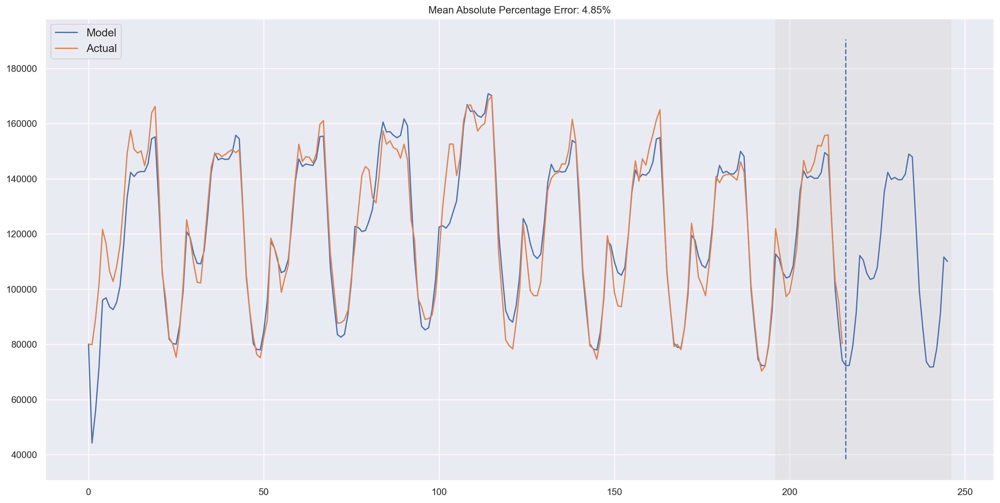

In [73]:
plotHoltWinters(ads.Ads)

也能从信赖区间捕捉异常值，会发现异常值还是存在的

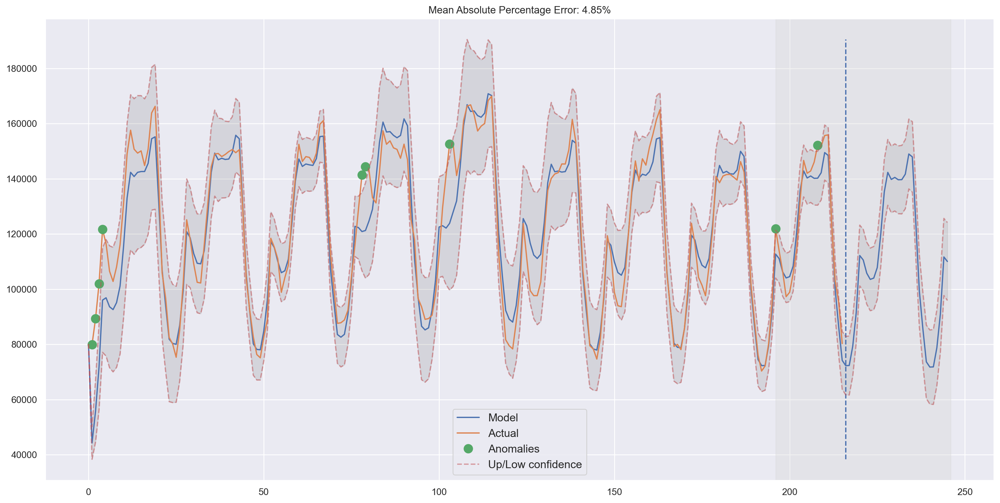

In [74]:
plotHoltWinters(ads.Ads, plot_intervals=True, plot_anomalies=True)

此为模型偏差图，可以清楚地看到模型对序列结构的变化反应非常强烈，但是很快就会把偏差恢复到正常值，“遗忘”过去   
该模型的这一特性能快速构建异常检测系统，即使对于非常嘈杂的系列，也不需要花费太多的时间和金钱来准备数据和训练模型

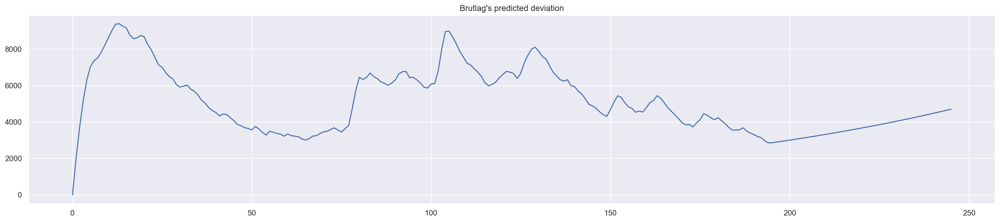

In [75]:
plt.figure(figsize=(25, 5))
plt.plot(model.PredictedDeviation)
plt.grid(True)
plt.axis('tight')
plt.title("Brutlag's predicted deviation");

### 2.2.3.2 手游玩家每天的游戏币消费
设定变化周期30天（一个月）

此为训练后得到的最合适参数组合，也就是可以使得Loss Function最小：

In [104]:
%%time
data = currency.GEMS_GEMS_SPENT[:-50] 
slen = 30 # 30-day seasonality

x = [0, 0, 0] 

opt = minimize(timeseriesCVscore, x0=x, 
               args=(data, mean_absolute_percentage_error, slen), 
               method="TNC", bounds = ((0, 1), (0, 1), (0, 1))
              )

alpha_final, beta_final, gamma_final = opt.x
print('alpha_final:',alpha_final, 'beta_final:',beta_final, 'gamma_final:',gamma_final)

model = HoltWinters(data, slen = slen, 
                    alpha = alpha_final, 
                    beta = beta_final, 
                    gamma = gamma_final, 
                    n_preds = 50, scaling_factor = 3)
model.triple_exponential_smoothing()

alpha_final: 0.013190344846993662 beta_final: 0.047616267647338284 gamma_final: 0.0
CPU times: user 1.78 s, sys: 21.6 ms, total: 1.8 s
Wall time: 1.78 s


下图为拟和出来的模型，以及实际值：

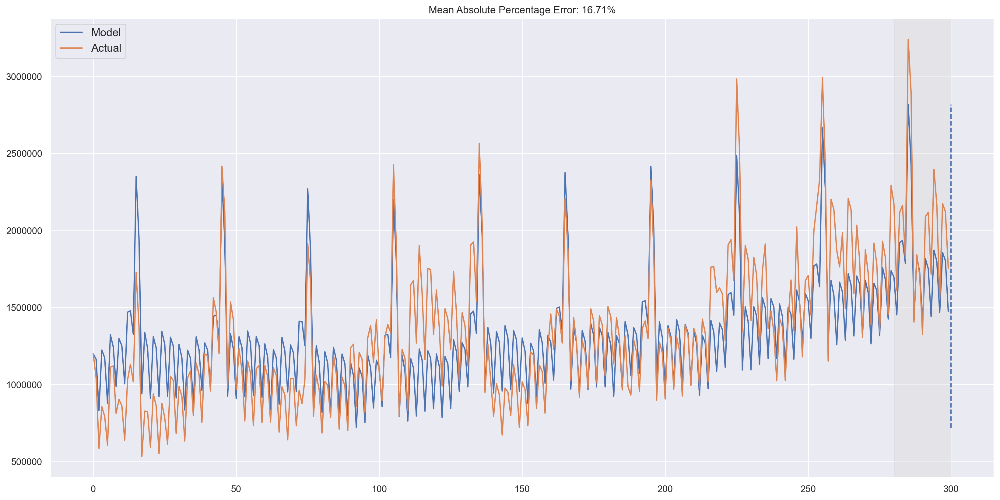

In [105]:
plotHoltWinters(currency.GEMS_GEMS_SPENT)
plotHoltWinters(currency.GEMS_GEMS_SPENT, plot_intervals=True, plot_anomalies=True)
plt.figure(figsize=(25, 5))
plt.plot(model.PredictedDeviation)
plt.grid(True)
plt.axis('tight')
plt.title("Brutlag's predicted deviation");

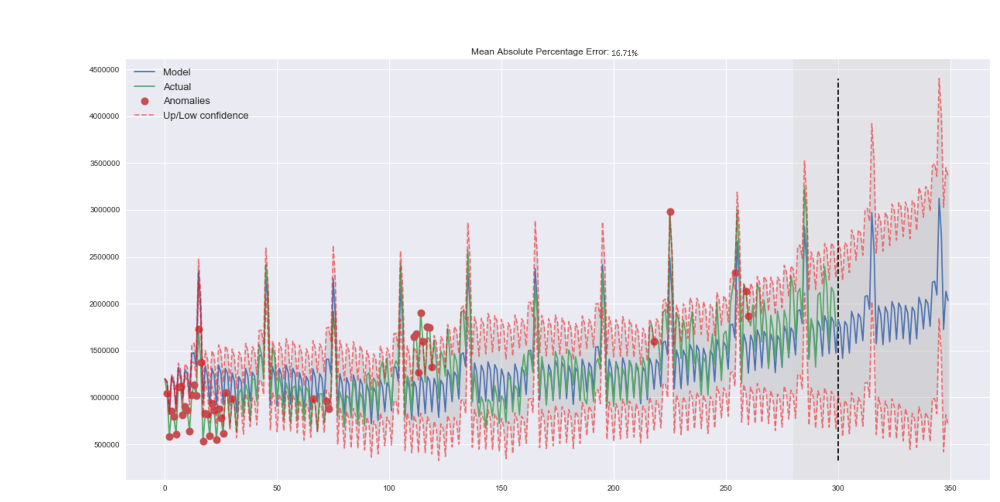

此为模型偏差图，可以清楚地看到模型对序列结构的变化反应越趋稳定

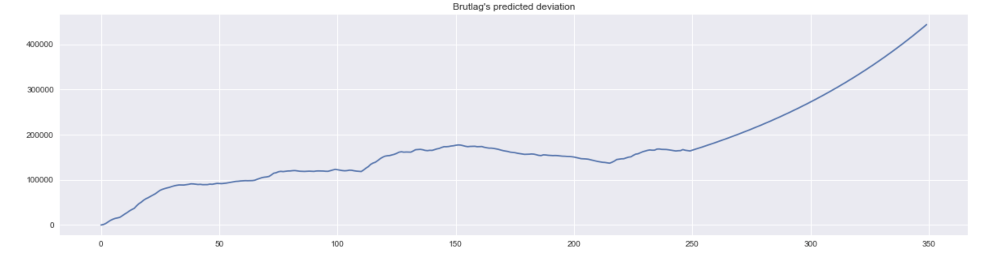

### 2.3 小结
每个数据适合的方法都不同
- Exponential Smoothing: 因为不考虑整体上升或下降趋势，以此只适用于手游玩家每小时观看的广告量
- Double Exponential Smoothing: 因为不考虑整体上升或下降趋势，适用于手游玩家每天的游戏币消费
- Triple Exponential Smoothing(Holt-Winters Model): 手游玩家每小时观看的广告量和手游玩家每天的游戏币消费都为季节性时序数据，故都适用，且模型能够成功地逼近初始时间序列，捕捉到季节性、整体降趋势甚至一些异常

-------
### 3 ARIMA
### 3.1 平稳性检验
以时间序列图、ACF、PACF、Dickey-Fuller来检验

In [138]:
def tsplot(y, lags=None, figsize=(12, 7), style='bmh'):
    """
        Plot time series, its ACF and PACF, calculate Dickey–Fuller test
        
        y - timeseries
        lags - how many lags to include in ACF, PACF calculation
    """
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style):    
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()

### 3.1.1 手游玩家每小时观看的广告量
初始序列是平稳的，Dickey-Fuller拒绝了单位根存在的$H_0$   
而且也能從图形本身就可以看出—没有明显的趋势，故均值是恒定的，整个序列的方差也相对比较稳定 $\Rightarrow$ 在建模之前只需处理季节性，为此让采用“季节差分”，也就是对序列进行简单的减法操作，时差等于季节周期 

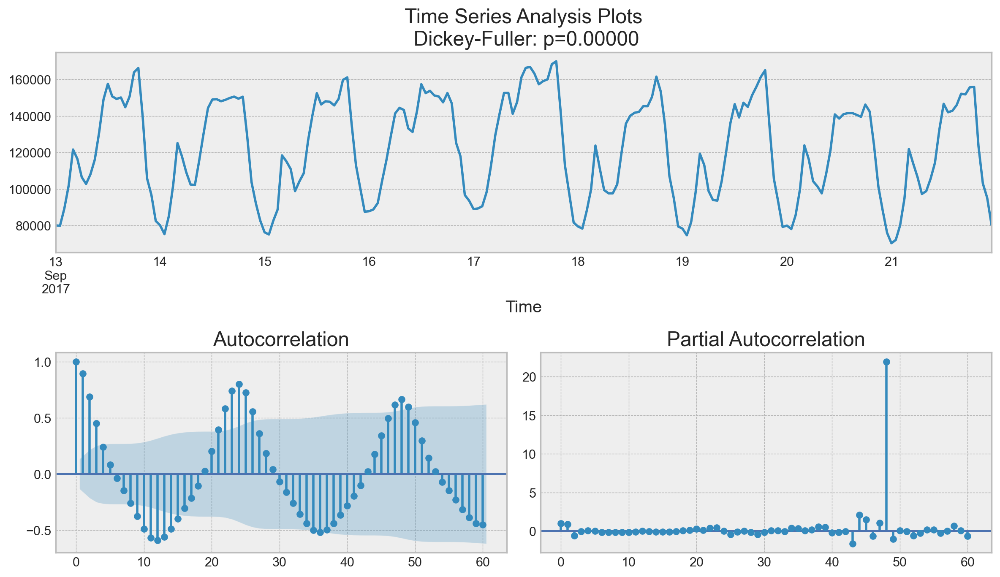

In [108]:
tsplot(ads.Ads, lags=60)

采用“季节差分”後，明顯可以看出季节性消失，但是ACF仍然有太多的明显滞后(阴影外的点为滞后点)为了移除它们 $\Rightarrow$ 取一阶差分：从序列中减去自身（时差为1）

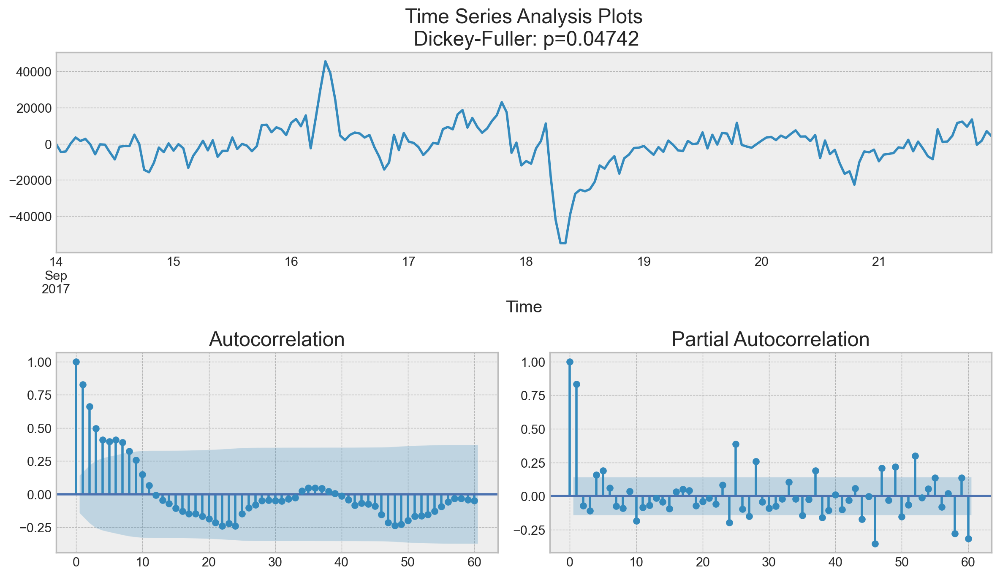

In [109]:
ads_diff = ads.Ads - ads.Ads.shift(24)
tsplot(ads_diff[24:], lags=60)

采用季节性差分和一阶差分后，序列可在零周围振荡，且Dickey-Fuller显示此序列平稳，又ACF中的滞后点变少，ACF的明显尖峰也不见了 $\Rightarrow$ 可以开始建模

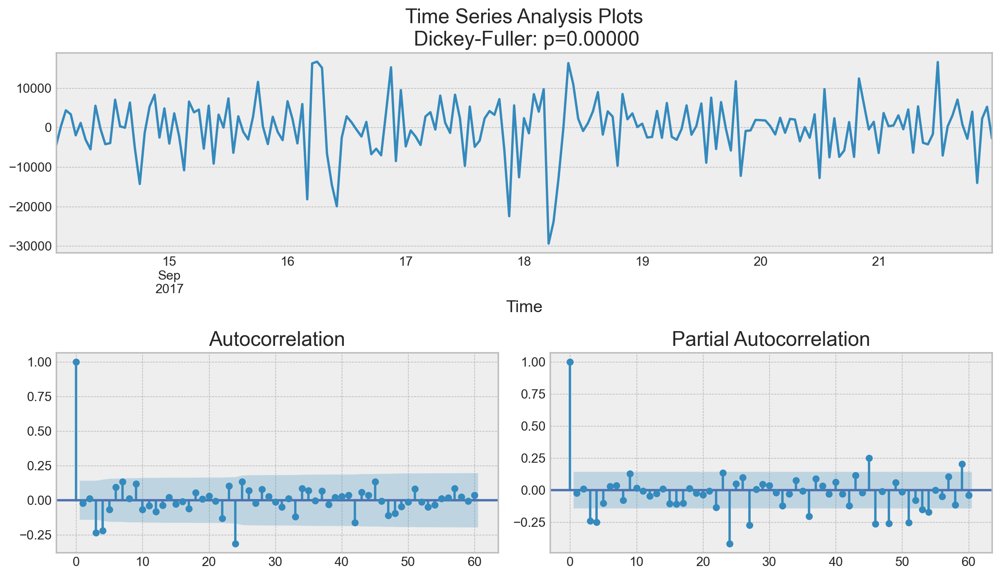

In [110]:
ads_diff = ads_diff - ads_diff.shift(1)tsplot(ads_diff[24+1:], lags=60)

### 3.1.2 手游玩家每天的游戏币消费
初始序列是不平稳的，Dickey-Fuller不拒绝单位根存在的$H_0$   
而且也能从图形本身就可以看出有明显上升的趋势，故均值是不恒定的，且也有季节性趋势 $\Rightarrow$ 在建模之前只需处理季节性，为此让采用“季节差分”，也就是对序列进行简单的减法操作，时差等于季节周期 

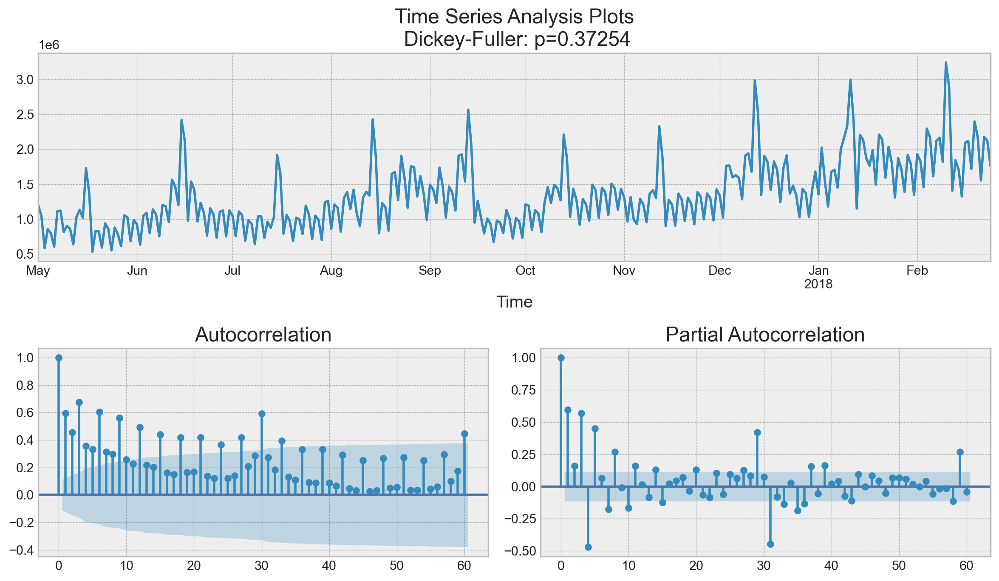

In [119]:
tsplot(currency.GEMS_GEMS_SPENT, lags=60)

采用“季节差分”后，明显可以看出季节性大都消失，且Dickey-Fuller的p-value值下降许多，但是ACF仍然有太多的明显滞后(阴影外的点为滞后点)为了移除它们 $\Rightarrow$ 取一阶差分：从序列中减去自身（时差为1）

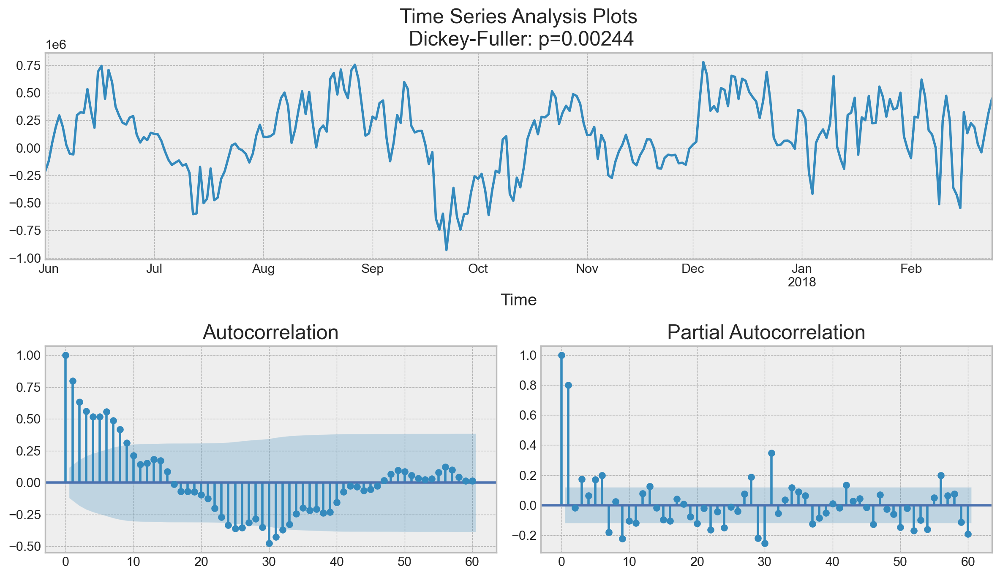

In [147]:
cur_diff = currency.GEMS_GEMS_SPENT - currency.GEMS_GEMS_SPENT.shift(30)
tsplot(cur_diff[30:], lags=60)

采用季节性差分和一阶差分后，序列可在零周围振荡，且Dickey-Fuller显示此序列平稳，又ACF中的滞后点变少，ACF的明显尖峰也不见了 $\Rightarrow$ 可以开始建模

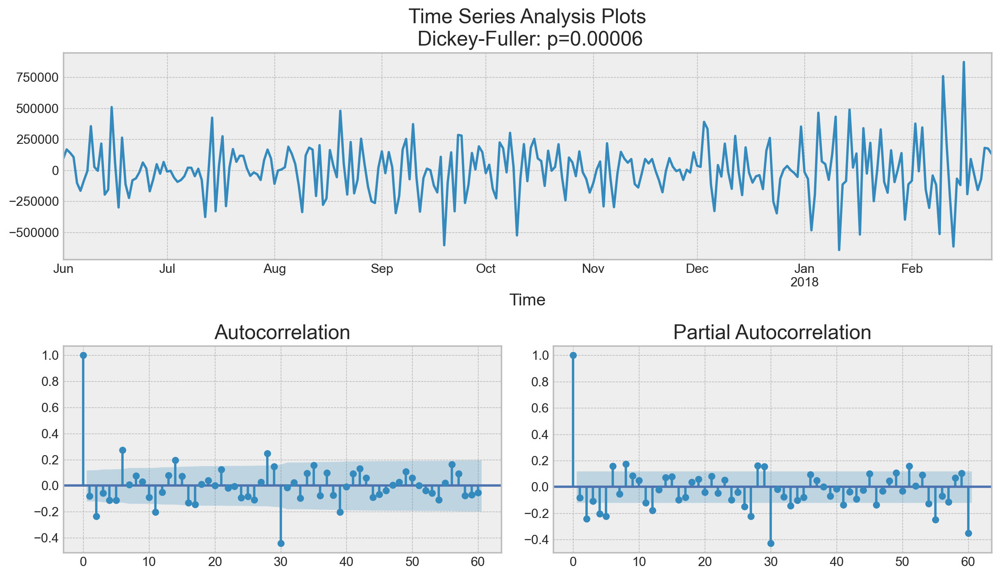

In [148]:
cur_diff = cur_diff - cur_diff.shift(1)
tsplot(cur_diff[30+1:], lags=60)
#cur_diff[30+2:]

-----
### 3.2 Seasonal Autoregression Moving Average model
Seasonal Autoregression Moving Average model(季节自回归移动平均模型): $ARIMA(p,d,q)(P,D,Q,s)$
- $AR(p)$：autoregression model(自回归模型)，即时间序列对自身的回归   
    基本假设是当前的序列值取决于它之前的值，并且存在一定的滞后 $\Rightarrow$ 模型最大的滞后值称为p，要在PACF中确定初始的p值   
      
      
- $MA(q)$：moving average model(移动平均值模型)，基于当前的误差依赖于先前的误差，有一定的滞后性（滞后值记为q）   
    和上面一样，可以在ACF中找到滞后值q的初始值      
    $\Rightarrow AR(p)+MA(q)=ARMA(p,q)$ (自回归移动平均模型)，如果初始序列是平稳的，可以通过这个模型逼近这一序列   
    
    

- $I(d)$：d 阶，表示使得序列平稳所需的非季节性差异的数量    
    
    
    

- $S(s)$：表示序列是季节性的，$S(s)$等于这个季节周期的长度值     
    
    
    

- $P$：自回归模型的季节性分量的阶数，可以看PACF中显着滞后的数量为季节周期长度的几倍P，P为季节周期长度的倍数   
    
     
- $Q$：移动平均模型中季节分量的阶数，初始值的确定和P同理，不过使用的是ACF   
   
   
- $D$：季节性整合阶数，取值等于1或0，表示是否应用季节差分

### 3.2.1 手游玩家每小时观看的广告量

由3.1.1的平稳性检定和下图得出：
- p:最有可能为4   
    从PACF中，可以观测到的最大滞后值
- d:等于1   
    因为使用的是一阶差分
- q:最有可能为3   
    从ACF中可以看出
- P:最有可能为1   
    因为PACF中第24个是比较明显的滞后点
- D:等于1   
    表示季节差分处理
- Q:最有可能为1   
    因为ACF中，第24个滞后是比较明显的，第48个滞后不太明显

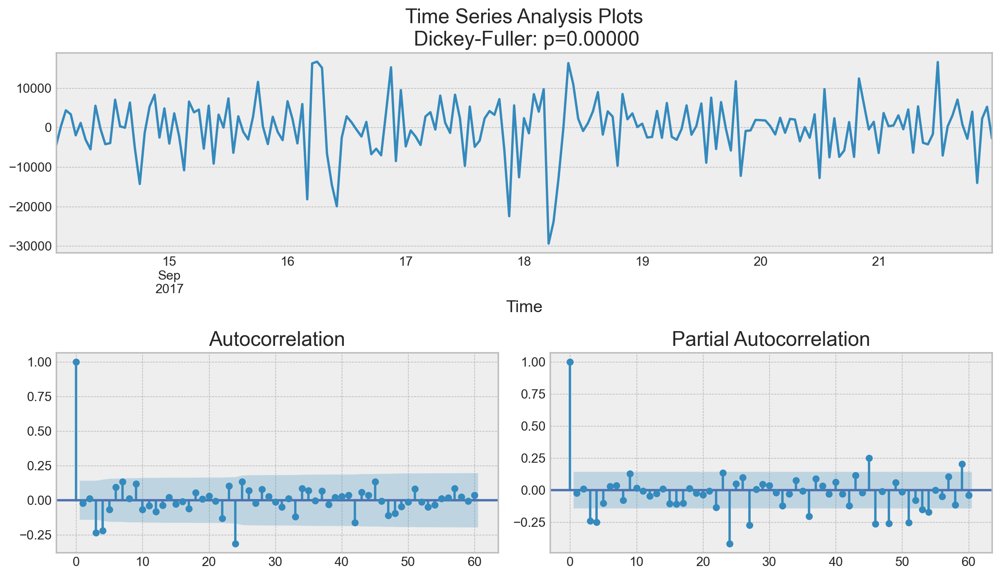

In [110]:
ads_diff = ads_diff - ads_diff.shift(1)
tsplot(ads_diff[24+1:], lags=60)

i. 设置参数搜索区间

In [117]:
# setting initial values and some bounds for them
ps = range(2, 5)
d=1 
qs = range(2, 5)
Ps = range(0, 3)
D=1 
Qs = range(0, 2)
s = 24 # season length is still 24

# creating list with all the possible combinations of parameters
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
print('parameters_list:',len(parameters_list)) # 输出为 54 

parameters_list: 54


ii. 寻找ARIMA模型的最佳参数组合

In [113]:
def optimizeSARIMA(parameters_list, d, D, s):
    """
        Return dataframe with parameters and corresponding AIC
        
        parameters_list - list with (p, q, P, Q) tuples
        d - integration order in ARIMA model
        D - seasonal integration order 
        s - length of season
    """
    
    results = []
    best_aic = float("inf")

    for param in tqdm_notebook(parameters_list):
        # we need try-except because on some combinations model fails to converge
        try:
            model=sm.tsa.statespace.SARIMAX(ads.Ads, order=(param[0], d, param[1]), 
                                            seasonal_order=(param[2], D, param[3], s)).fit(disp=-1)
        except:
            continue
        aic = model.aic
        # saving best model, AIC and parameters
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results)
    result_table.columns = ['parameters', 'aic']
    # sorting in ascending order, the lower AIC is - the better
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)
    
    return result_table
    
result_table = optimizeSARIMA(parameters_list, d, D, s)

  0%|          | 0/54 [00:00<?, ?it/s]

iii. 设置 SARIMA 模型最佳参数，查看模型输出结果    
    
    
    
- p:
    - 猜测为4   
    - 配适为2
- d:等于1   
    - 猜测为1  
    - 配适为2
- q:
    - 猜测为3   
    - 配适为3
- P:
    - 猜测为1  
    - 配适为1
- D:
    - 猜测为1   
    - 配适为1
- Q:
    - 猜测为1   
    - 配适为1

In [114]:
p, q, P, Q = result_table.parameters[0]

best_model=sm.tsa.statespace.SARIMAX(ads.Ads, order=(p, d, q), 
                                        seasonal_order=(P, D, Q, s)).fit(disp=-1)
print(best_model.summary())

                                      SARIMAX Results                                       
Dep. Variable:                                  Ads   No. Observations:                  216
Model:             SARIMAX(2, 1, 3)x(1, 1, [1], 24)   Log Likelihood               -1936.321
Date:                              Fri, 14 May 2021   AIC                           3888.642
Time:                                      23:12:27   BIC                           3914.660
Sample:                                  09-13-2017   HQIC                          3899.181
                                       - 09-21-2017                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7913      0.270      2.928      0.003       0.262       1.321
ar.L2         -0.55

iv. 模型的残差分布情况   
序列在零周围振荡，且Dickey-Fuller显示此序列平稳，又ACF、PACF中的滞后点幾乎消失

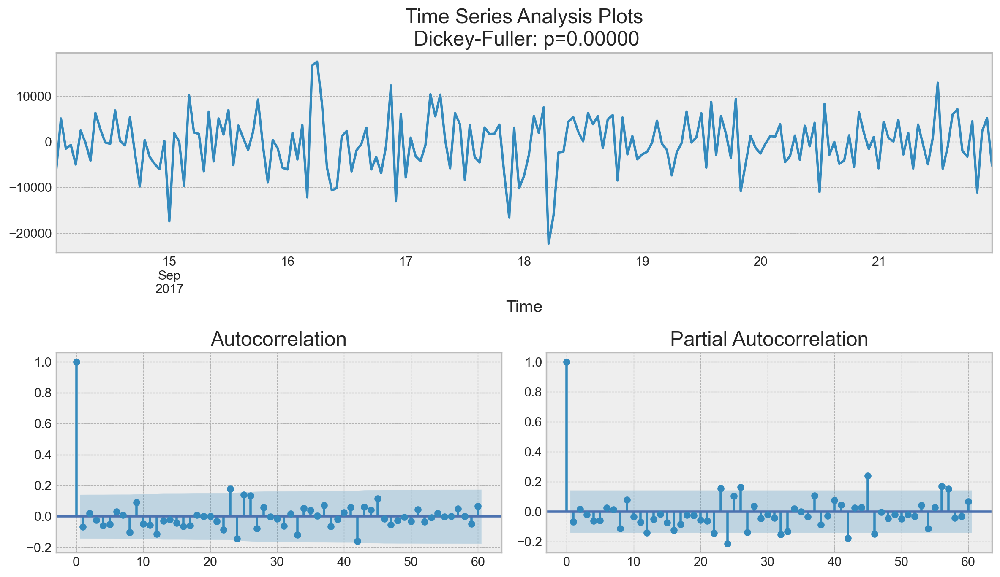

In [115]:
tsplot(best_model.resid[24+1:], lags=60)

v. 模型预测
Mean Absolute Percentage Error=3.94%

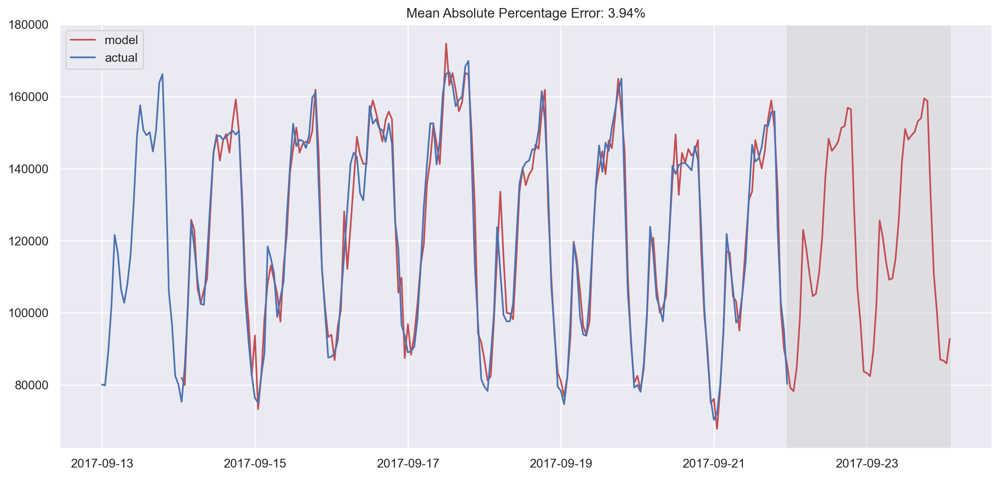

In [116]:
def plotSARIMA(series, model, n_steps):
    """
        Plots model vs predicted values
        
        series - dataset with timeseries
        model - fitted SARIMA model
        n_steps - number of steps to predict in the future
        
    """
    # adding model values
    data = series.copy()
    data.columns = ['actual']
    data['arima_model'] = model.fittedvalues
    # making a shift on s+d steps, because these values were unobserved by the model
    # due to the differentiating
    data['arima_model'][:s+d] = np.NaN
    
    # forecasting on n_steps forward 
    forecast = model.predict(start = data.shape[0], end = data.shape[0]+n_steps)
    forecast = data.arima_model.append(forecast)
    # calculate error, again having shifted on s+d steps from the beginning
    error = mean_absolute_percentage_error(data['actual'][s+d:], data['arima_model'][s+d:])

    plt.figure(figsize=(15, 7))
    plt.title("Mean Absolute Percentage Error: {0:.2f}%".format(error))
    plt.plot(forecast, color='r', label="model")
    plt.axvspan(data.index[-1], forecast.index[-1], alpha=0.5, color='lightgrey')
    plt.plot(data.actual, label="actual")
    plt.legend()
    plt.grid(True);
    
plotSARIMA(ads, best_model, 50)

### 3.2.2 手游玩家每天的游戏币消费
由3.1.2的平稳性检定和下图得出：
- p:最有可能为2   
    从PACF中，可以观测到的最大滞后值
- d:等于1   
    因为使用的是一阶差分
- q:最有可能为2   
    从ACF中可以看出
- P:最有可能为2   
    因为PACF中第30&60个是比较明显的滞后点
- D:等于1   
    表示季节差分处理
- Q:最有可能为1  
    因为ACF中，第30个滞后是比较明显的，第60个滞后不太明显

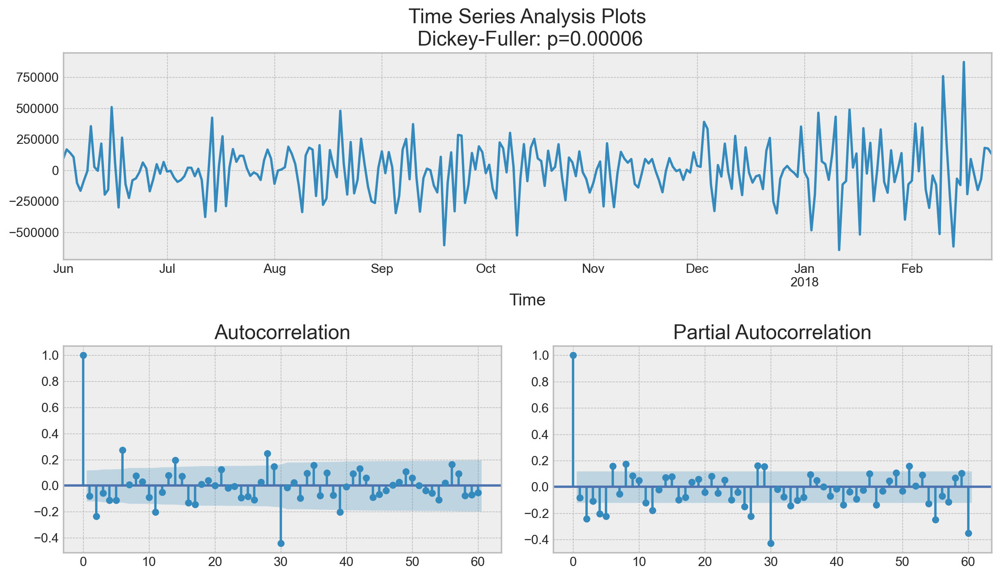

In [148]:
cur_diff = cur_diff - cur_diff.shift(1)
tsplot(cur_diff[30+1:], lags=60)
#cur_diff[30+2:]

i. 设置参数搜索区间

In [158]:
# setting initial values and some bounds for them
ps = range(2, 6)
d=1 
qs = range(0, 3)
Ps = range(0, 3)
D=1 
Qs = range(0, 2)
s = 30 # season length is 30

# creating list with all the possible combinations of parameters
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
print('parameters_list:',len(parameters_list)) # 输出为 72

parameters_list: 72


ii. 寻找ARIMA模型的最佳参数组合

In [159]:
def optimizeSARIMA(parameters_list, d, D, s):
    """
        Return dataframe with parameters and corresponding AIC
        
        parameters_list - list with (p, q, P, Q) tuples
        d - integration order in ARIMA model
        D - seasonal integration order 
        s - length of season
    """
    
    results = []
    best_aic = float("inf")

    for param in tqdm_notebook(parameters_list):
        # we need try-except because on some combinations model fails to converge
        try:
            model=sm.tsa.statespace.SARIMAX(currency.GEMS_GEMS_SPENT, order=(param[0], d, param[1]), 
                                            seasonal_order=(param[2], D, param[3], s)).fit(disp=-1)
        except:
            continue
        aic = model.aic
        # saving best model, AIC and parameters
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results)
    result_table.columns = ['parameters', 'aic']
    # sorting in ascending order, the lower AIC is - the better
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)
    
    return result_table
    
result_table = optimizeSARIMA(parameters_list, d, D, s)

  0%|          | 0/72 [00:00<?, ?it/s]

iii. 设置 SARIMA 模型最佳参数，查看模型输出结果    
   
  
- p:
    - 猜测为2   
    - 配适为5
- d:等于1   
    - 猜测为1  
    - 配适为1
- q:
    - 猜测为2   
    - 配适为2
- P:
    - 猜测为2  
    - 配适为2
- D:
    - 猜测为1   
    - 配适为1
- Q:
    - 猜测为1   
    - 配适为1

In [160]:
p, q, P, Q = result_table.parameters[0]

best_model=sm.tsa.statespace.SARIMAX(currency.GEMS_GEMS_SPENT, order=(p, d, q), 
                                        seasonal_order=(P, D, Q, s)).fit(disp=-1)
print(best_model.summary())

                                      SARIMAX Results                                      
Dep. Variable:                     GEMS_GEMS_SPENT   No. Observations:                  300
Model:             SARIMAX(5, 1, 2)x(2, 1, [], 30)   Log Likelihood               -3605.888
Date:                             Sat, 15 May 2021   AIC                           7231.777
Time:                                     00:33:25   BIC                           7267.724
Sample:                                 05-01-2017   HQIC                          7246.213
                                      - 02-24-2018                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9503      0.176     -5.402      0.000      -1.295      -0.605
ar.L2         -0.8488      

iv. 模型的残差分布情况   
序列在零周围振荡，且Dickey-Fuller显示此序列平稳，又ACF、PACF中的滞后点幾乎消失

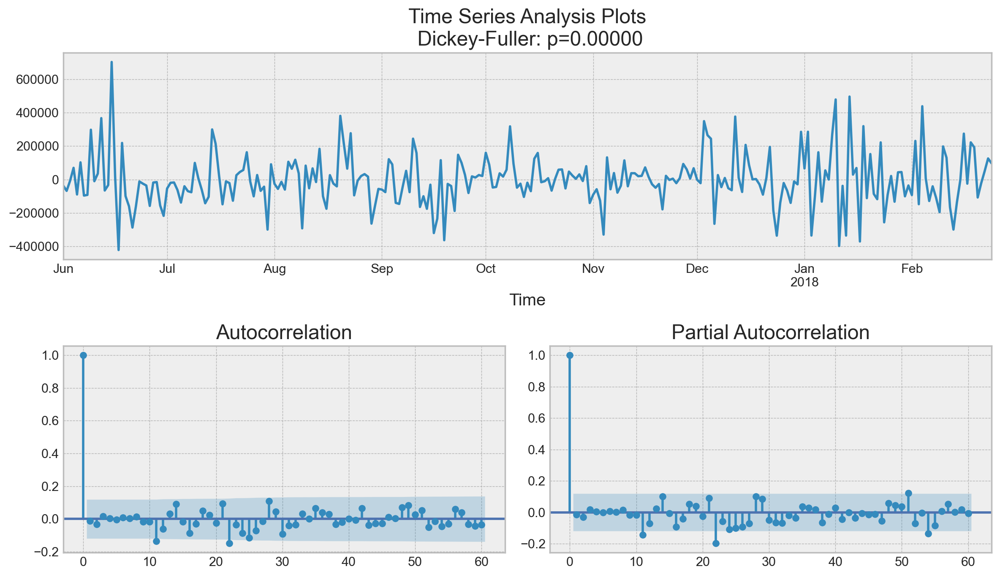

In [161]:
tsplot(best_model.resid[30+1:], lags=60)

v. 模型预测
Mean Absolute Percentage Error=7.94%

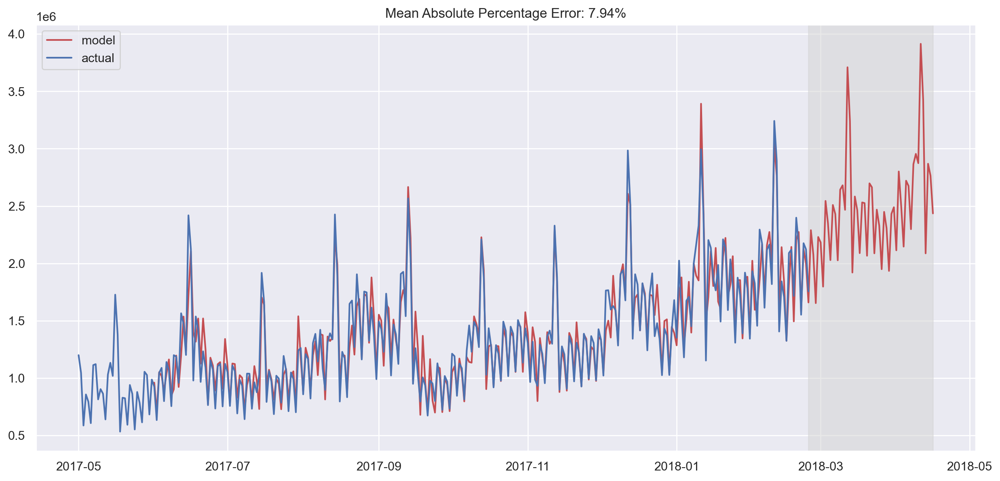

In [163]:
plotSARIMA(currency, best_model, 50)

-------
# 4. 结论
由于此报告内的两个数据都是季节性时间序列，因此在使用的方法中( Moving Average Method、Smoothing Method、Exponential Smoothing、Double Exponential Smoothing、Triple Exponential Smoothing(Holt-Winters Model)、Seasonal Autoregression Moving Average model )，考量季节性的Triple Exponential Smoothing(Holt-Winters Model)和Seasonal Autoregression Moving Average model应该最为合适   
    
    
而这两个方法的Mean Absolute Percentage Error为：
- Triple Exponential Smoothing(Holt-Winters Model)
    - 手游玩家每小时观看的广告量: 4.85
    - 手游玩家每天的游戏币消费情况: 16.71
- Seasonal Autoregression Moving Average model
    - 手游玩家每小时观看的广告量: 3.94
    - 手游玩家每天的游戏币消费情况: 7.94
    
根据Mean Absolute Percentage Error和季节性因素，最适合这两个数据的是Seasonal Autoregression Moving Average model，且会发现比较特别的是，短时间序列(手游玩家每小时观看的广告量)在两个模型间的Mean Absolute Percentage Error远小于中长时间序列(手游玩家每天的游戏币消费情况)，可见若非短时间季节性时间序列则最适用Seasonal Autoregression Moving Average model